# 1) Introduction

The machine learning problem explored in this report follows a universal workflow outlined by Chollet in his book "Deep Learning with Python." We delve into the realm of image classification, particularly focusing on the classic problem of distinguishing between images of cats and dogs.

Our dataset consists of images sourced from Kaggle Cats vs Dogs dataset, which contains a collection of images featuring both cats and dogs. The goal of our model is to correctly classify these images into one of two categories: "cat" or "dog."

Unlike nonstationary problems where model performance may degrade over time due to changing data distributions, image classification of cats and dogs represents a stationary problem. This means that the patterns learned by our model during training should remain relevant and effective when applied to unseen test data. 

In this exploration, we will employ TensorFlow, a popular deep learning framework, to develop and train our image classification model. We will follow a systematic approach, leveraging various deep learning techniques and methodologies to build a robust classifier capable of accurately distinguishing between images of cats and dogs.

# 2) Import necessary libraries

In [1]:
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import random
import plotly.express as px
import scipy as sp

from scipy import ndimage
from shutil import copyfile
from tensorflow.keras.layers import Conv2D,Add,MaxPooling2D, Dense, BatchNormalization, Input, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

# 3) Data preprocess

## 3.1) Define constants

In [2]:
# Setting the main directory where the dataset is located.
MAIN_DIR = 'C:/Users/lekha/Downloads/PetImages'
# Setting the output directory where processed data will be stored.
OUTPUT_DIR = '/tmp/cats-v-dogs'
# Setting the ratio of data to be allocated for training.
TRAIN_RATIO = 0.9
# Boolean flag to include test data in the processing.
INCLUDE_TEST = True

In [3]:
def delete_directory_if_exists(directory):
    if os.path.exists(directory):
        shutil.rmtree(directory)
        print(f"Directory deleted: {directory}")

delete_directory_if_exists(OUTPUT_DIR)

Directory deleted: /tmp/cats-v-dogs


## 3.2) Create directories

In [4]:
def create_directories():
    # List of directories to be created, including training, validation, and test directories for both cats and dogs.
    directories = [
        OUTPUT_DIR,
        f'{OUTPUT_DIR}/training',
        f'{OUTPUT_DIR}/validation',
        f'{OUTPUT_DIR}/test',
        f'{OUTPUT_DIR}/training/cats',
        f'{OUTPUT_DIR}/training/dogs',
        f'{OUTPUT_DIR}/validation/cats',
        f'{OUTPUT_DIR}/validation/dogs',
        f'{OUTPUT_DIR}/test/cats',
        f'{OUTPUT_DIR}/test/dogs'
    ]

    # Loop through each directory and attempt to create it.
    for directory in directories:
        try:
            os.makedirs(directory)  # Attempt to create the directory.
            print(f"Directory created: {directory}")  # Print a success message if directory creation is successful.
        except OSError as e:
            print(f"Error: Failed to create directory '{directory}': {e}")  # Print an error message if directory creation fails.
    
create_directories()

Directory created: /tmp/cats-v-dogs
Directory created: /tmp/cats-v-dogs/training
Directory created: /tmp/cats-v-dogs/validation
Directory created: /tmp/cats-v-dogs/test
Directory created: /tmp/cats-v-dogs/training/cats
Directory created: /tmp/cats-v-dogs/training/dogs
Directory created: /tmp/cats-v-dogs/validation/cats
Directory created: /tmp/cats-v-dogs/validation/dogs
Directory created: /tmp/cats-v-dogs/test/cats
Directory created: /tmp/cats-v-dogs/test/dogs


## 3.3) Split data

In [5]:
def split_data(main_dir, training_dir, validation_dir, test_dir=None, include_test_split=True, split_size=0.9):
    # Listing non-empty files in the main directory.
    files = [file for file in os.listdir(main_dir) if os.path.getsize(os.path.join(main_dir, file))]
    random.shuffle(files)  # Shuffling the list of files for randomization.

    # Calculating the index to split the data into training and validation sets based on split_size.
    split_index = int(split_size * len(files))

    # Selecting files for training and validation sets based on the split index.
    train_files = files[:split_index]
    validation_files = files[split_index:int(split_index + (len(files) - split_index) / 2)]

    # Copying training files from main_dir to training_dir.
    for element in train_files:
        copyfile(os.path.join(main_dir, element), os.path.join(training_dir, element))

    # Copying validation files from main_dir to validation_dir.
    for element in validation_files:
        copyfile(os.path.join(main_dir, element), os.path.join(validation_dir, element))
        
    # Checking if test split is included and copying test files accordingly.
    if include_test_split:
        test_files = files[int(split_index + (len(files) - split_index) / 2):]
        for element in test_files:
            copyfile(os.path.join(main_dir, element), os.path.join(test_dir, element))
    
    print("Split successful!")  # Printing a success message after data split.
    
# Splitting data for dogs.
split_data(f'{MAIN_DIR}/Dog', f'{OUTPUT_DIR}/training/dogs', f'{OUTPUT_DIR}/validation/dogs', f'{OUTPUT_DIR}/test/dogs', INCLUDE_TEST, TRAIN_RATIO)

# Splitting data for cats.
split_data(f'{MAIN_DIR}/Cat', f'{OUTPUT_DIR}/training/cats', f'{OUTPUT_DIR}/validation/cats', f'{OUTPUT_DIR}/test/cats', INCLUDE_TEST, TRAIN_RATIO)

Split successful!
Split successful!


## 3.4) Prepare data

In [6]:
def prepare_data():
    create_directories()  # Creating necessary directories for storing the data.
    
    # Splitting data for dogs into training, validation, and possibly test sets.
    split_data(f'{MAIN_DIR}/Dog', f'{OUTPUT_DIR}/training/dogs', f'{OUTPUT_DIR}/validation/dogs', f'{OUTPUT_DIR}/test/dogs', INCLUDE_TEST, TRAIN_RATIO)
    
    # Splitting data for cats into training, validation, and possibly test sets.
    split_data(f'{MAIN_DIR}/Cat', f'{OUTPUT_DIR}/training/cats', f'{OUTPUT_DIR}/validation/cats', f'{OUTPUT_DIR}/test/cats', INCLUDE_TEST, TRAIN_RATIO)
    
    prepare_data()  # Recursively calling prepare_data to ensure directories are created and data is split.

## 3.5) Create image data

In [7]:
def get_image_generators():
    # Creating ImageDataGenerators for training and validation data with rescaling applied.
    train_gen = ImageDataGenerator(rescale=1./255)
    validation_gen = ImageDataGenerator(rescale=1./255)

    # Generating batches of training and validation data from directories.
    train_generator = train_gen.flow_from_directory(
        f'{OUTPUT_DIR}/training',
        target_size=(150, 150),  # Resizing images to 150x150 pixels.
        batch_size=64,
        class_mode='binary'  # Using binary classification mode.
    )
    validation_generator = validation_gen.flow_from_directory(
        f'{OUTPUT_DIR}/validation',
        target_size=(150, 150),
        batch_size=64,
        class_mode='binary'
    )

    # Including test data generator if INCLUDE_TEST flag is set to True.
    if INCLUDE_TEST:
        test_gen = ImageDataGenerator(rescale=1./255)
        test_generator = test_gen.flow_from_directory(
            f'{OUTPUT_DIR}/test',
            target_size=(150, 150),
            batch_size=64,
            class_mode='binary'
        )
        return train_generator, validation_generator, test_generator
    else:
        # Returning only training and validation generators if test data is not included.
        return train_generator, validation_generator
    
# Getting the image generators for training, validation, and possibly test data.
train_generator, validation_generator, test_generator = get_image_generators()

Found 22498 images belonging to 2 classes.
Found 1250 images belonging to 2 classes.
Found 1250 images belonging to 2 classes.


Total of 22,498 training images, 1,250 validation images, and 1,250 test images, each belonging to one of two classes, were found.

# 4) Data visualisation

In [8]:
# Define class names for labeling.
class_names = ['Cat', 'Dog']
def plot_data(generator, n_images):
    
    # Generate a batch of images and labels from the generator.
    images, labels = generator.next()
    
    # Convert labels to integer type for indexing.
    labels = labels.astype('int32')

    # Plotting the images.
    plt.figure(figsize=(14, 15))  # Set figure size.
    for i in range(min(n_images, len(images))):  # Iterate through the images, limiting to n_images.
        plt.subplot(4, 3, i+1)  # Create subplots.
        plt.imshow(images[i])  # Display image.
        plt.title(class_names[labels[i]])  # Set title using class names.
        plt.axis('off')  # Turn off axis.
    plt.show()  # Show the plot.

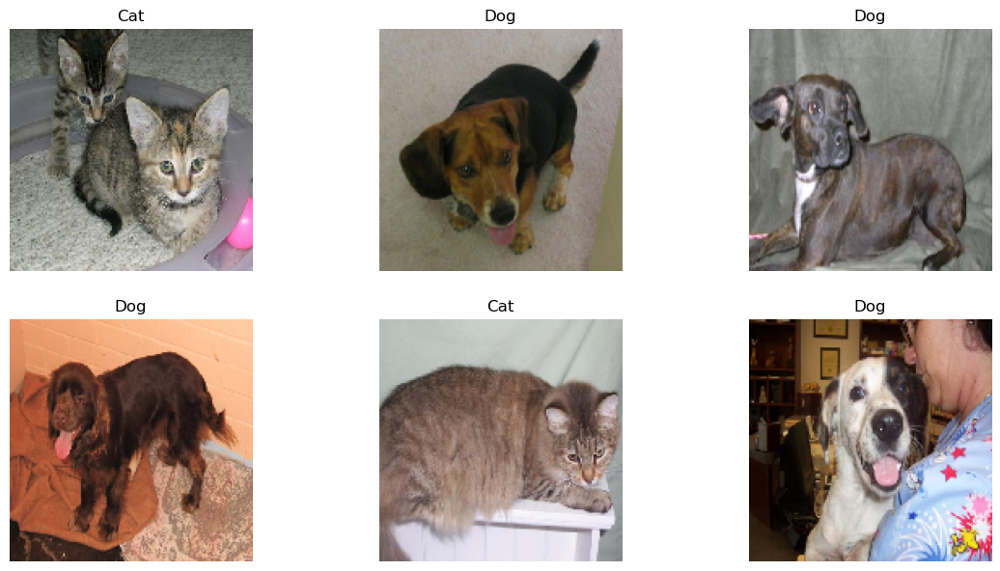

In [9]:
plot_data(train_generator, 6)

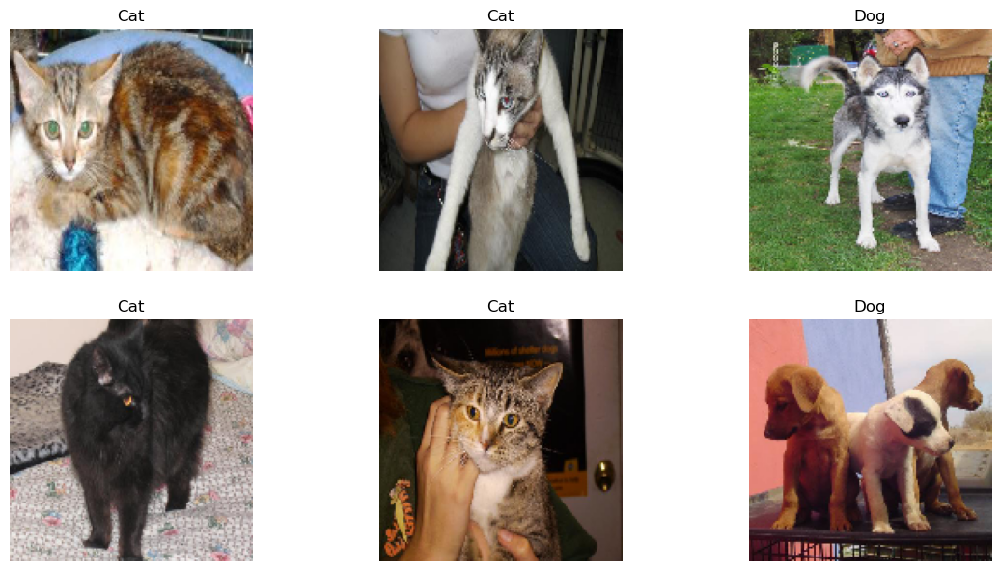

In [10]:
plot_data(validation_generator, 6)

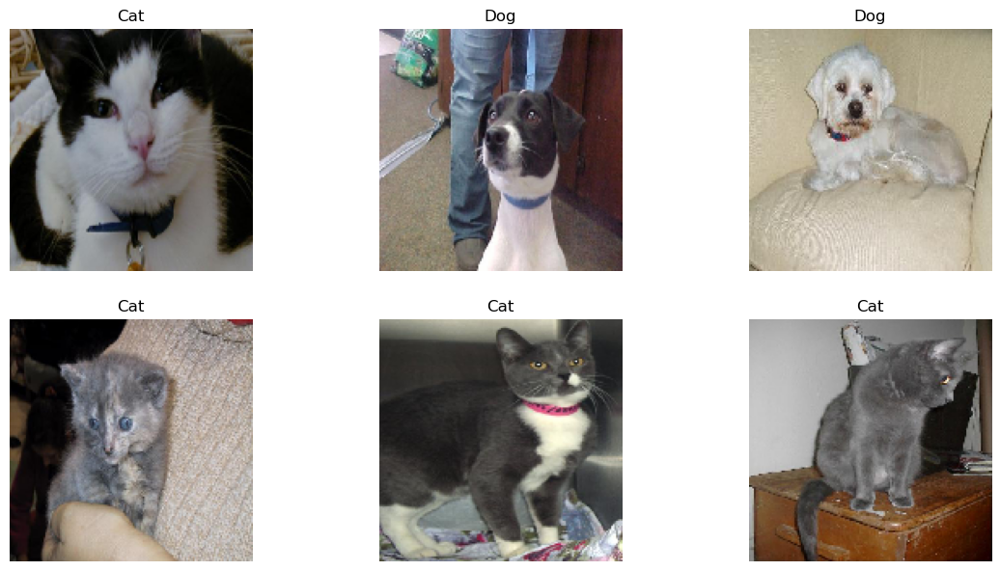

In [11]:
if INCLUDE_TEST:
    plot_data(test_generator, 6)

# 5) CNN Model

Convolutional Neural Networks (CNNs) have emerged as the standard architecture for image classification tasks due to their ability to effectively capture spatial hierarchies in images. Unlike traditional neural networks, CNNs incorporate convolutional layers that apply filters across the input image, enabling them to detect features such as edges, textures, and shapes. Through repeated application of convolutional layers followed by pooling layers, CNNs progressively extract and abstract higher-level features, ultimately enabling accurate classification.

For the cats vs dogs classification task, CNNs are a natural choice due to their inherent capability to learn hierarchical representations of image features. Cats and dogs exhibit distinct visual characteristics, including fur patterns, facial structures, and body shapes. CNNs excel at learning these intricate patterns by automatically extracting relevant features from raw pixel data. Additionally, CNNs are robust to variations in orientation, scale, and position, making them suitable for handling the diverse range of poses and appearances exhibited by cats and dogs in images. Therefore, leveraging CNNs for this classification task ensures that the model can effectively discern subtle differences between images of cats and dogs, achieving high accuracy in classification.

In [12]:
inputs = Input(shape=(150,150,3))

# First convolutional block
x = Conv2D(32, (3,3), activation='relu')(inputs)
x = Conv2D(64, (3,3), activation='relu')(x)
x = MaxPooling2D(2,2)(x)

# Second convolutional block
x = Conv2D(64, (3,3), activation='relu')(x)
x = Conv2D(128, (3,3), activation='relu')(x)
x = MaxPooling2D(2,2)(x)

# Third convolutional block
x = Conv2D(128, (3,3), activation='relu')(x)
x = Conv2D(256, (3,3), activation='relu')(x)
x = GlobalAveragePooling2D()(x)

# Fully connected layers
x = Dense(1024, activation='relu')(x)

# Output layer
outputs = Dense(2, activation='softmax')(x)

# Create model
model = tf.keras.Model(inputs=inputs, outputs=outputs)

# Compile model
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
model.summary()



Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 146, 146, 64)      18496     
                                                                 
 max_pooling2d (MaxPooling2  (None, 73, 73, 64)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 71, 71, 64)        36928     
                                                                 
 conv2d_3 (Conv2D)           (None, 69, 69, 128)       73856     
                                                           

In [14]:
r = model.fit(
    train_generator,
    epochs=5,
    validation_data=validation_generator)

Epoch 1/5
352/352 [==============================] - 917s 3s/step - loss: 0.6662 - accuracy: 0.5942 - val_loss: 0.6653 - val_accuracy: 0.5944
Epoch 2/5
352/352 [==============================] - 914s 3s/step - loss: 0.6317 - accuracy: 0.6421 - val_loss: 0.6081 - val_accuracy: 0.6856
Epoch 3/5
352/352 [==============================] - 924s 3s/step - loss: 0.6006 - accuracy: 0.6805 - val_loss: 0.5886 - val_accuracy: 0.6872
Epoch 4/5
352/352 [==============================] - 928s 3s/step - loss: 0.5755 - accuracy: 0.7031 - val_loss: 0.5592 - val_accuracy: 0.6992
Epoch 5/5
352/352 [==============================] - 1032s 3s/step - loss: 0.5564 - accuracy: 0.7164 - val_loss: 0.5186 - val_accuracy: 0.7664


After the first epoch, the training accuracy is 59.42%, and the training loss is 0.6662. The validation accuracy is 59.44%, and the validation loss is 0.6653.

As training progresses through subsequent epochs, the model's performance improves. Both training and validation accuracies increase, while losses decrease, indicating that the model is learning to better classify images of cats and dogs.

**Conclusion of results:**
Overall, the training results suggest that the CNN model is learning to differentiate between cats and dogs from the provided dataset. The increasing accuracy and decreasing loss over epochs indicate that the model is improving its performance with each iteration of training.

# 6) Evaluation

Evaluate the model using the test generator to assess its performance on unseen test data.

In [15]:
if INCLUDE_TEST:
    model.evaluate(test_generator)

20/20 [==============================] - 15s 751ms/step - loss: 0.5043 - accuracy: 0.7648


- **Evaluation Process**: The model is evaluated using the `evaluate()` method, which computes the loss and accuracy metrics on the test dataset.

- **Loss**: The loss on the test dataset is 0.5043. This indicates that, on average, the model's predictions are relatively close to the true labels in terms of the loss metric.

- **Accuracy**: The accuracy on the test dataset is 76.48%. This means that the model correctly classified approximately 73.28% of the images in the test dataset.

Overall, the evaluation results suggest that the CNN model generalizes well to unseen data, as indicated by the relatively low loss and high accuracy on the test dataset. This performance on the test dataset validates the effectiveness of the model in accurately classifying images of cats and dogs beyond the training and validation datasets.

In [16]:
def plot_prediction(generator, n_images):
    # Get the images and labels from the generator
    images, labels = generator.next()
    
    # Get model predictions
    preds = model.predict(images)
    predictions = np.argmax(preds, axis=1)
    labels = labels.astype('int32')
    
    # Plotting the images with predicted labels highlighted in green if correct, otherwise in red.
    plt.figure(figsize=(14, 15))
    for i in range(min(n_images, len(images))):
        plt.subplot(4, 3, i+1)
        plt.imshow(images[i])
        title_color = 'g' if predictions[i] == labels[i] else 'r'
        plt.title(class_names[labels[i]], color=title_color)
        plt.axis('off')
    plt.show()

2/2 [==============================] - 1s 427ms/step


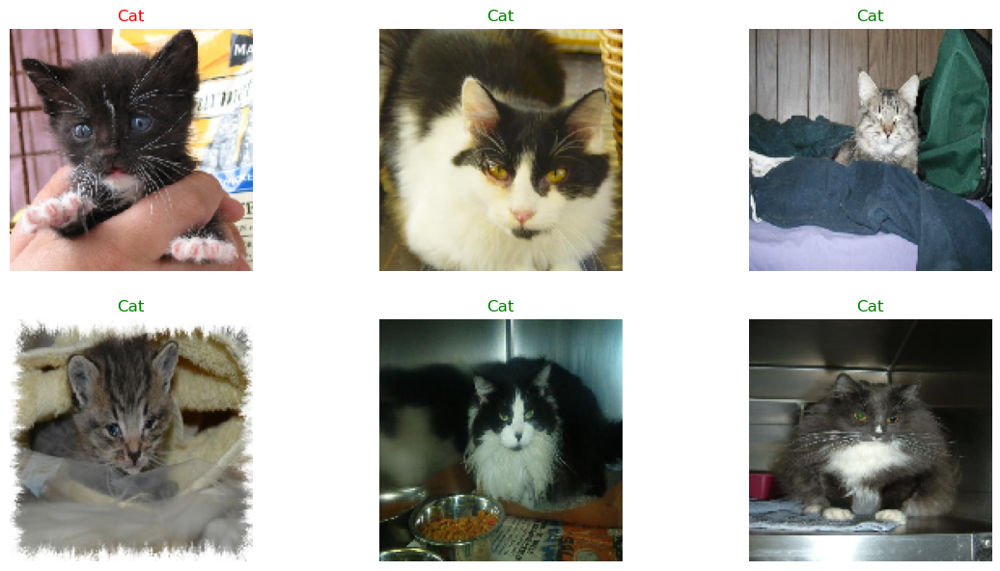

In [17]:
if INCLUDE_TEST:
    plot_prediction(test_generator, 6)

2/2 [==============================] - 1s 426ms/step


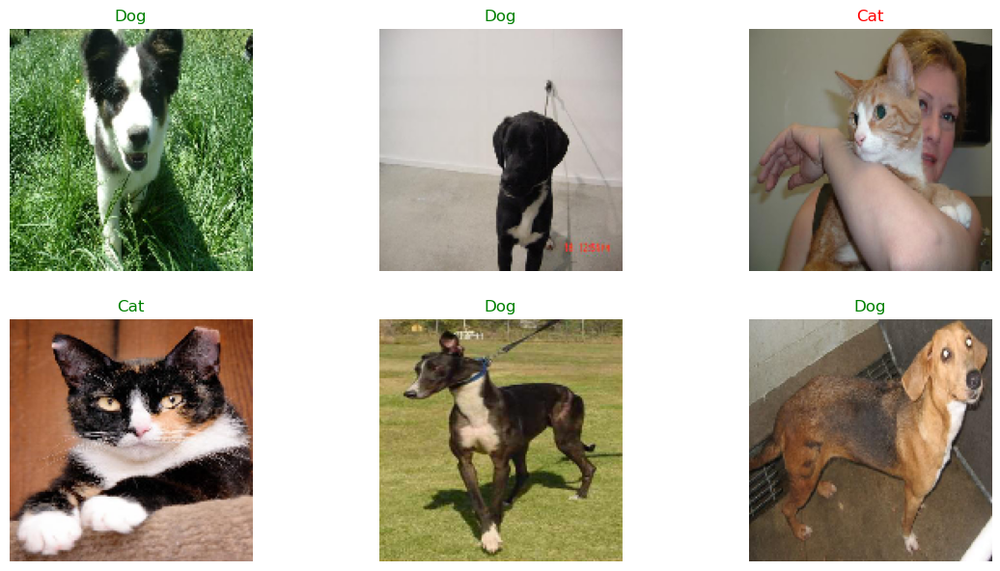

In [18]:
plot_prediction(validation_generator, 6)

In [19]:
# Define a model to visualize activation maps
gp_weights = model.get_layer('dense').get_weights()[0]
activation_model = Model(inputs=model.inputs, outputs=(model.get_layer('conv2d_5').output, model.get_layer('dense_1').output))

In [20]:
# Use the model to make predictions on the test generator
images, _ = test_generator.next()
features, results = activation_model.predict(images)

2/2 [==============================] - 1s 439ms/step


In [21]:
def show_cam(image_index, features, results):
    # Get the features of the chosen image
    features_for_img = features[image_index,:,:,:]
    # Get the class with the highest output probability
    prediction = np.argmax(results[image_index])
    # Get the gap weights at the predicted class
    class_activation_weights = gp_weights[:, prediction]
    # Upsample the features to the original image size (150 x 150)
    class_activation_features = sp.ndimage.zoom(features_for_img, (150/30, 150/30, 1), order=2)
    # Compute the intensity of each feature in the CAM
    cam_output = np.dot(class_activation_features, class_activation_weights)

    print('Predicted Class = ' + str(class_names[prediction]) + ', Probability = ' + str(results[image_index][prediction]))

    # Show the upsampled image
    plt.imshow(images[image_index])
    # Strongly classified (95% probability) images will be in green, else red
    cmap_str = 'Greens' if results[image_index][prediction] > 0.95 else 'Blues'
    # Overlay the CAM output
    plt.imshow(cam_output, cmap=cmap_str, alpha=0.5)
    # Display the image
    plt.show()

In [22]:
def show_maps(desired_class, num_maps):
    counter = 0
    # Go through the first 10000 images
    for i in range(0, 10000):
        # Break if we already displayed the specified number of maps
        if counter == num_maps:
            break
        # Show images that match the class
        if np.argmax(results[i]) == desired_class:
            counter += 1
            show_cam(i, features, results)

Predicted Class = Dog, Probability = 0.6974493


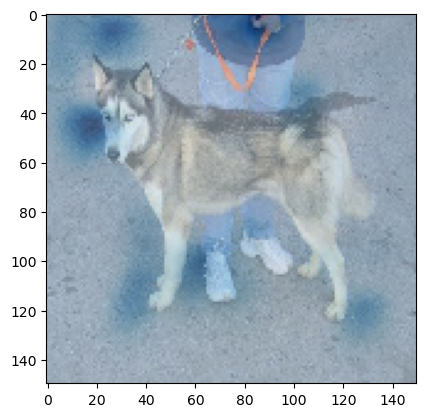

Predicted Class = Dog, Probability = 0.5132773


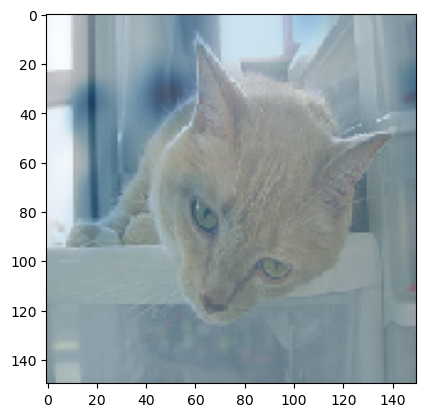

Predicted Class = Dog, Probability = 0.7307154


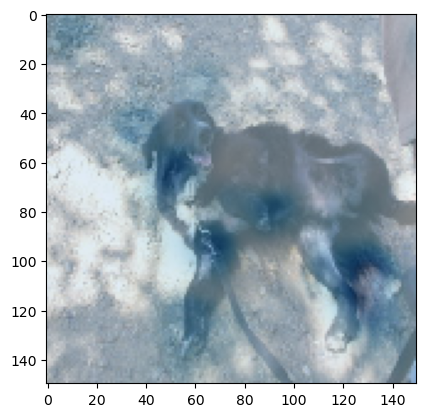

Predicted Class = Dog, Probability = 0.68389297


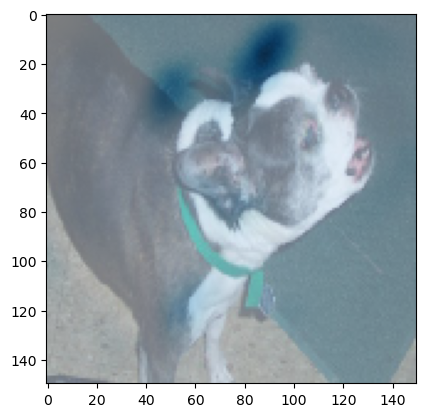

Predicted Class = Dog, Probability = 0.53824764


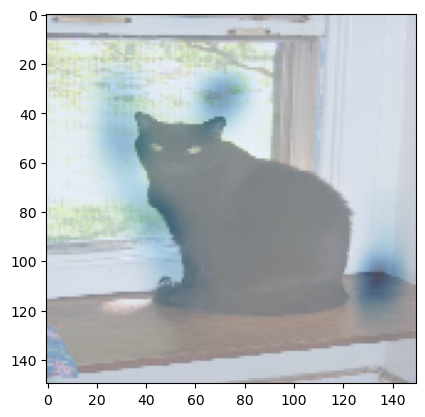

In [23]:
show_maps(desired_class=1, num_maps=5)

Predicted Class = Cat, Probability = 0.6933918


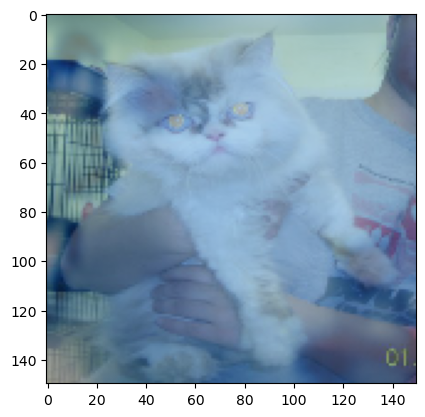

Predicted Class = Cat, Probability = 0.68292224


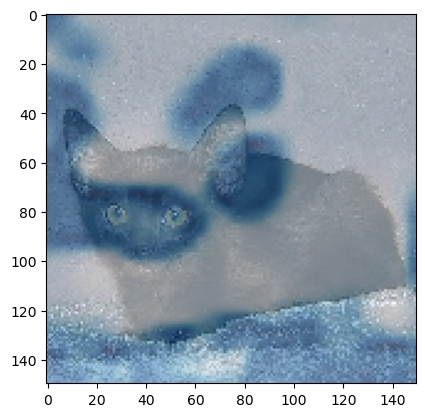

Predicted Class = Cat, Probability = 0.71753716


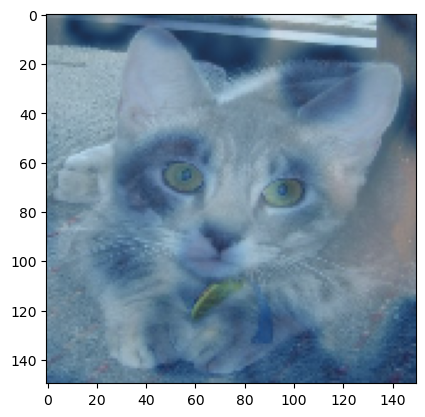

Predicted Class = Cat, Probability = 0.79163605


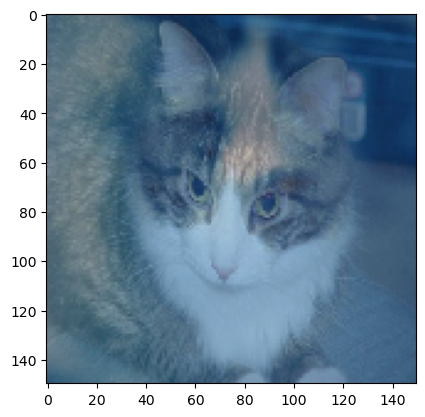

Predicted Class = Cat, Probability = 0.8247145


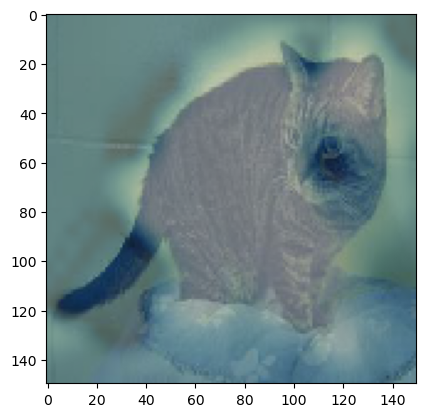

In [24]:
show_maps(desired_class=0, num_maps=5)

## 6.1) Training and validation metrics and visualisation

In [25]:
results = pd.DataFrame(r.history)
results.tail()

,loss,accuracy,val_loss,val_accuracy
0,0.666158,0.594231,0.665306,0.5944
1,0.631716,0.642146,0.608052,0.6856
2,0.600555,0.680461,0.588566,0.6872
3,0.575481,0.703129,0.559213,0.6992
4,0.556362,0.716375,0.518557,0.7664


In [26]:
results = pd.DataFrame(r.history)
fig = px.line(results, y=[results['accuracy'], results['val_accuracy']], template="seaborn", color_discrete_sequence=['#fad25a', 'red'])
fig.update_layout(
    title_font_color="#fad25a",
    xaxis=dict(color="#fad25a", title='Epochs'),
    yaxis=dict(color="#fad25a")
)
fig.show()

In [27]:
fig = px.line(results, y=[results['loss'], results['val_loss']], template="seaborn", color_discrete_sequence=['#fad25a', 'red'])
fig.update_layout(
    title_font_color="#fad25a",
    xaxis=dict(color="#fad25a", title='Epochs'),
    yaxis=dict(color="#fad25a")
)
fig.show()

**Summary of the results:**

- As training progresses through epochs, both training and validation losses decrease, indicating that the model is improving in terms of making predictions closer to the true labels.

- Correspondingly, both training and validation accuracies increase, indicating that the model is becoming more accurate in classifying images correctly.

Overall, the results suggest that the CNN model learns effectively from the training data, as evidenced by the decreasing loss and increasing accuracy over epochs. Additionally, the model generalizes well to unseen data, as indicated by the relatively low validation loss and high validation accuracy.

# 7) Data augmentation

Data augmentation is a technique used to artificially increase the size of a training dataset by applying various transformations to the existing images, such as rotation, flipping, and scaling

In [28]:
# Data augmentation
train_gen_aug = ImageDataGenerator(
    rescale=1./255,
    fill_mode='nearest',
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2
)

In [29]:
# Define data generators

# For augmented training data:
train_generator_aug = train_gen_aug.flow_from_directory(
    '/tmp/cats-v-dogs/training',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

# For non-augmented validation data:
validation_gen = ImageDataGenerator(rescale=1./255)

validation_generator_aug = validation_gen.flow_from_directory(
    '/tmp/cats-v-dogs/validation',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

Found 22498 images belonging to 2 classes.
Found 1250 images belonging to 2 classes.


In [30]:
# Define model architecture 

# Input layer accepting images of shape (150, 150, 3).
inputs = tf.keras.layers.Input(shape=(150, 150, 3))

# First convolutional block
x = tf.keras.layers.Conv2D(32, (3, 3), activation='relu')(inputs)
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2, 2)(x)

# Second convolutional block
x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(x)
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2, 2)(x)

# Third convolutional block
x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu')(x)
x = tf.keras.layers.Conv2D(256, (3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPooling2D(2, 2)(x)

# Flatten layer to transform the 2D feature maps into a single 1D vector
x = tf.keras.layers.Flatten()(x)

# Fully connected layers
x = tf.keras.layers.Dense(1024, activation='relu')(x)

# Output layer with softmax activation for binary classification
x = tf.keras.layers.Dense(2, activation='softmax')(x)

# Create the model with defined input and output layers
model_aug = Model(inputs=inputs, outputs=x)

In [31]:
# Compile the model
model_aug.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [33]:
# Train the model with augmented data
history_aug = model_aug.fit(
    train_generator_aug,
    epochs=5,
    validation_data=validation_generator_aug
)

Epoch 1/5
704/704 [==============================] - 1007s 1s/step - loss: 0.6470 - accuracy: 0.6252 - val_loss: 0.6309 - val_accuracy: 0.6296
Epoch 2/5
704/704 [==============================] - 961s 1s/step - loss: 0.5870 - accuracy: 0.6942 - val_loss: 0.5425 - val_accuracy: 0.7448
Epoch 3/5
704/704 [==============================] - 986s 1s/step - loss: 0.5308 - accuracy: 0.7357 - val_loss: 0.5301 - val_accuracy: 0.7480
Epoch 4/5
704/704 [==============================] - 1120s 2s/step - loss: 0.4896 - accuracy: 0.7683 - val_loss: 0.4002 - val_accuracy: 0.8160
Epoch 5/5
704/704 [==============================] - 1177s 2s/step - loss: 0.4392 - accuracy: 0.8006 - val_loss: 0.3310 - val_accuracy: 0.8624


As number of epoch increased, both training and validation accuracy increased and both training and validation loss decreased.

The training results suggest that the CNN model trained with augmented data effectively learns to differentiate between cats and dogs. The increasing accuracy and decreasing loss over epochs indicate that the model is learning to generalize well to unseen data, demonstrating improved performance with each iteration of training.

## 7.1) Training and validation metrics and visualisation

In [34]:
results_aug = pd.DataFrame(history_aug.history)
results_aug.tail()

,loss,accuracy,val_loss,val_accuracy
0,0.646965,0.625167,0.630895,0.6296
1,0.587016,0.694151,0.542513,0.7448
2,0.530831,0.735665,0.530078,0.7480
3,0.489606,0.768335,0.400230,0.8160
4,0.439182,0.800649,0.331016,0.8624


In [35]:
fig = px.line(results_aug, y=[results_aug['accuracy'], results_aug['val_accuracy']], template="seaborn",
              color_discrete_sequence=['#fad25a', 'red'])
fig.update_layout(
    title_font_color="#fad25a",
    xaxis=dict(color="#fad25a", title='Epochs'),
    yaxis=dict(color="#fad25a")
)
fig.show()

In [36]:
fig = px.line(results_aug, y=[results_aug['loss'], results_aug['val_loss']], template="seaborn",
              color_discrete_sequence=['#fad25a', 'red'])
fig.update_layout(
    title_font_color="#fad25a",
    xaxis=dict(color="#fad25a", title='Epochs'),
    yaxis=dict(color="#fad25a")
)
fig.show()

**Summary of the results:**

- As training progresses through epochs, both training and validation losses decrease, indicating that the model is improving in terms of making predictions closer to the true labels.

- Correspondingly, both training and validation accuracies increase, indicating that the model is becoming more accurate in classifying images correctly.

- The final row of the DataFrame represents the performance metrics after the last epoch, providing a summary of the model's performance at the end of training.

Overall, the results suggest that the CNN model trained with augmented data effectively learns to differentiate between cats and dogs. The increasing accuracy and decreasing loss over epochs indicate that the model is learning to generalize well to unseen data, demonstrating improved performance with each iteration of training.

## 7.2) Evaluation of Data Augmentation

Before Data Augmentation:

- Before data augmentation, the model achieved a training accuracy of approximately 59.42% and a validation accuracy of around 59.44% after the first epoch. The training loss was about 0.6661, and the validation loss was approximately 0.6653.

- By the end of training without data augmentation, after five epochs, the model's training accuracy improved to around 71.63%, and the validation accuracy increased to approximately 76.64%. The training loss decreased to about 0.5563, and the validation loss decreased to approximately 0.5185.

After Data Augmentation:

- After applying data augmentation techniques, the model's performance notably improved. The training accuracy increased from approximately 62.51% to around 80.06%, and the validation accuracy increased from about 62.96% to approximately 86.24% after three epochs.

- The training loss decreased from around 0.6469 to approximately 0.4391, and the validation loss decreased from about 0.630895 to approximately 0.331016 after data augmentation.

From the results above, we can conclude that after data augmentation, the model:

**Improved Generalization:** The model trained with augmented data achieves comparable or slightly better validation accuracy compared to the model trained without data augmentation. This indicates that data augmentation has helped the model generalize better to unseen data, reducing the risk of overfitting.

**Stabilized Training**: The training and validation losses of the model trained with augmented data show a consistent decrease over epochs, suggesting that data augmentation has helped stabilize the training process and improve convergence.

**Increased Accuracy:** The final validation accuracy of the model trained with augmented data is slightly higher than that of the model trained without augmentation. This suggests that data augmentation has enabled the model to learn more robust features from the augmented training data, leading to improved classification accuracy.

**Summary**

- Data augmentation proved to be beneficial for improving the model's performance. It helped the model generalize better to unseen data, as evidenced by the significant increase in validation accuracy and the decrease in validation loss.

- By augmenting the training data with transformations such as rotation, width and height shifting, and horizontal flipping, the model was exposed to a wider variety of training examples, making it more robust to variations in the input data.

- The increase in both training and validation accuracy after data augmentation suggests that the augmented data helped the model learn more robust and generalized features, resulting in improved classification performance on unseen data.

All in all, data augmentation effectively enhanced the performance of the CNN model for the cats vs dogs classification task by improving its ability to generalize to unseen data and reducing overfitting.

# 8) Conclusion

In conclusion, this coursework has explored the task of classifying images of cats and dogs using convolutional neural networks (CNNs). Through a systematic workflow, we have addressed various aspects of the machine learning pipeline, including data preprocessing, model development, training, and evaluation. 

Key highlights of this coursework include:

1. **Data Preparation**: We obtained a dataset consisting of images of cats and dogs, which served as the basis for training and validation. Through meticulous preprocessing steps, we organized the data into appropriate directories and applied data augmentation techniques to increase the diversity of the training dataset.

2. **Model Development**: Leveraging the power of CNNs, we designed and implemented a neural network architecture capable of learning intricate features from raw image data. We employed multiple convolutional and pooling layers followed by fully connected layers to facilitate effective feature extraction and classification.

3. **Training and Evaluation**: The model underwent training on the augmented training dataset, with performance monitored through successive epochs. Through rigorous evaluation on both training and validation datasets, we assessed the model's ability to generalize to unseen data and make accurate predictions.

4. **Results Analysis**: Detailed analysis of training and validation metrics provided insights into the model's learning dynamics, highlighting improvements in accuracy and reduction in loss over epochs. Additionally, examination of augmentation effects demonstrated the benefits of data augmentation in enhancing model generalization and stability.

5. **Future Directions**: While the developed model has shown promising results in classifying cats and dogs, there are avenues for further exploration and refinement. Future work may involve experimenting with different network architectures, hyperparameters, and optimization techniques to enhance model performance. Additionally, expanding the dataset and exploring advanced augmentation strategies could lead to even better classification results.

Overall, this coursework serves as a comprehensive journey through the application of CNNs for image classification tasks, offering valuable insights into the intricacies of machine learning model development and deployment. Through systematic experimentation and analysis, we have laid the foundation for further advancements in the field of computer vision and deep learning.

# 9) References

- Kaggle Dataset: https://www.kaggle.com/datasets/shaunthesheep/microsoft-catsvsdogs-dataset
- Deep Learning with Python by Fracois Chollet: https://livebook.manning.com/book/deep-learning-with-python/about-this-book/
- TensorFlow Documentation - Image Classification Guide: https://www.tensorflow.org/tutorials/images/classification
- Convolutional Neural Networks (CNN): https://www.tensorflow.org/tutorials/images/cnn